## Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
9. Genrate video with the pipeline designed above.

---
## 1. First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Disable warnings
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    
    shape = img.shape[1::-1]
    
    if shape[0] != 1280 or shape[1] != 720:
        print('Skipping image with non-standart shape: ', shape)
        continue
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(100)

cv2.destroyAllWindows()

# Calculate claibraion parameters
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, shape, None, None)

print("Calibration done")


Skipping image with non-standart shape:  (1281, 721)
Skipping image with non-standart shape:  (1281, 721)
Calibration done


## 2. Apply a distortion correction to raw images

In [2]:
def undistort(image):
    return cv2.undistort(np.copy(image), mtx, dist, None, mtx)


### 2.1 Test distortion correction

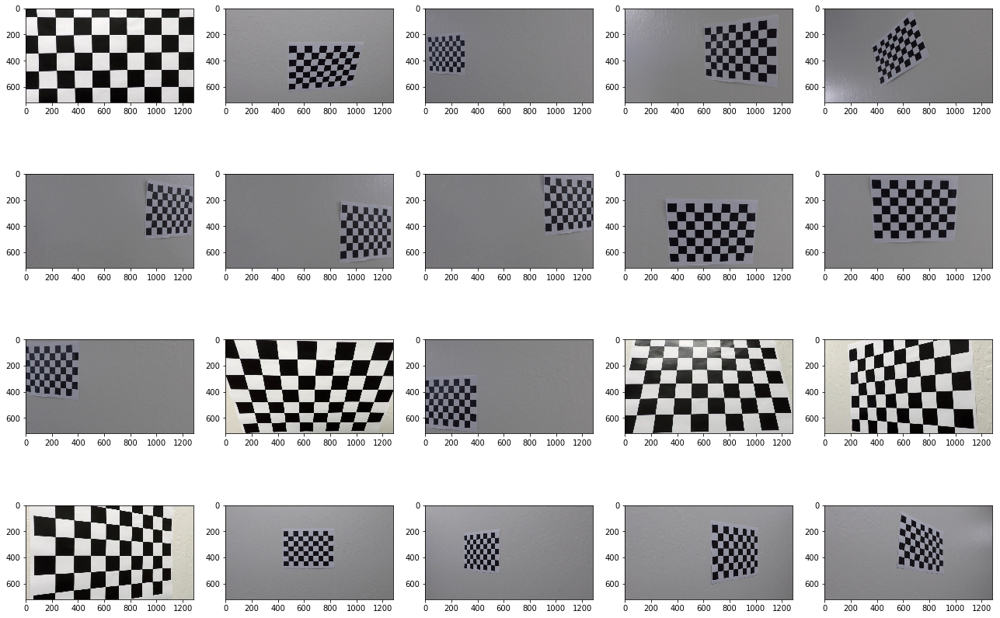

In [3]:
 f, ax = plt.subplots(4,5, figsize=(18, 12))
 f.tight_layout()

idx = 0

images = glob.glob('./camera_cal/calibration*.jpg')
for fname in images:
    img = cv2.imread(fname)
    
    row = idx // 5
    col = idx % 5
    ax[row, col].imshow(cv2.cvtColor(undistort(img), cv2.COLOR_BGR2RGB))
    
    idx += 1

plt.show()


## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

###  3.1 Helper functions to generate binary masks

In [31]:
def thresholded_binary(gray_image, threshold):
    binary = np.zeros_like(gray_image)
    binary[(gray_image >= threshold[0]) & (gray_image <= threshold[1])] = 1
    return binary

def gradient_magnitude(gray_image, sobel_kernel=5, dir_threshold = (0, 1.2)):
    sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0,  ksize=sobel_kernel) # Take the derivative in x
    sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1,  ksize=sobel_kernel) # Take the derivative in y
    absx = np.absolute(sobelx)
    absy = np.absolute(sobely)
    
    # Gradient magnitude
    mag =  np.sqrt(np.square(sobelx) + np.square(sobely))
    
    dir = np.arctan2(absy, absx)
    mag[(dir < dir_threshold[0]) | (dir > dir_threshold[1])] = 0
    
    # Scale it to range 0...255
    scaled_mag = np.uint8(255*mag/np.max(mag))
    
    return scaled_mag

def gradient_xy(gray_image, sobel_kernel=5, dir_threshold = (0, 1.2)):
    
    sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0,  ksize=sobel_kernel) # Take the derivative in x
    sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1,  ksize=sobel_kernel) # Take the derivative in y
    absx = np.absolute(sobelx)
    absy = np.absolute(sobely)
    
    proj = np.sqrt(2) / 2.0;
    
    gradxy = absx * proj + absy * proj
    
    dir = np.arctan2(absy, absx)
    gradxy[(dir < dir_threshold[0]) | (dir > dir_threshold[1])] = 0
    
    scaled = np.uint8(255* gradxy / np.max(gradxy))
    
    return scaled

def gradient_binary(gray_image, sobel_kernel=5, mag_threshold = (50, 255), grad_threshold = (0.5, np.pi/2)):
    
    sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0,  ksize=sobel_kernel) # Take the derivative in x
    sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1,  ksize=sobel_kernel) # Take the derivative in y
    absx = np.absolute(sobelx)
    absy = np.absolute(sobely)
    
    # Gradient magnitude
    mag =  np.sqrt(np.square(sobelx) + np.square(sobely))
    
    # Scale it to range 0...255
    scaled_mag = np.uint8(255*mag/np.max(mag))
    
    scaled_mag_x = np.uint8(255*absx/np.max(absx))
    
    # Gradient direction
    dir = np.arctan2(absy, absx)
    
    binary = np.zeros_like(gray_image)
    binary[(scaled_mag_x >= mag_threshold[0]) & (scaled_mag_x <= mag_threshold[1]) 
           & (dir >= grad_threshold[0]) & (dir <= grad_threshold[1])] = 1
    return binary

def combine_not(mask):
    result = np.zeros_like(mask, dtype = np.uint8)
    result[mask == 0] = 1
    return result

def combine_and(mask1, mask2):
    result = np.zeros_like(mask1, dtype = np.uint8)
    result[(mask1 > 0) & (mask2 > 0)] = 1
    return result

def combine_or(mask1, mask2):
    result = np.zeros_like(mask1, dtype = np.uint8)
    result[(mask1 > 0) | (mask2 > 0)] = 1
    return result

def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    return masked_image

def find_best_channel(filename):
    print(filename)
    image =  undistort(cv2.imread(filename))
    
    r = image[:,:,2]
    g = image[:,:,1]
    b = image[:,:,0]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    h = hls[:,:,0]
    l = hls[:,:,1]
    s = hls[:,:,2]
    
    rt = thresholded_binary(r, (128,255))
    gt = thresholded_binary(g, (128,255))
    grayt = thresholded_binary(gray, (168,255))
    
    gray_blur = thresholded_binary(cv2.GaussianBlur(gray, (21, 21), 0), (80,255))
    
    lt =  thresholded_binary(l, (128,255))
    st =  thresholded_binary(cv2.equalizeHist(s), (192,255))
    
    f, ax = plt.subplots(5,4, figsize=(14, 10))
    f.tight_layout()
    
    ax[0,0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[0,0].set_title("Source")
    
    ax[0,1].imshow(r, cmap='gray')
    ax[0,1].set_title("red")
    ax[0,2].imshow(g, cmap='gray')
    ax[0,2].set_title("green")
    ax[0,3].imshow(gray, cmap='gray')
    ax[0,3].set_title("gray")
    ax[1,1].imshow(rt, cmap='gray')
    ax[1,1].set_title("red")
    ax[1,2].imshow(gt, cmap='gray')
    ax[1,2].set_title("green")
    ax[1,3].imshow(grayt, cmap='gray')
    ax[1,3].set_title("gray")
    
    ax[2,0].imshow(l, cmap='gray')
    ax[2,0].set_title("l")
    ax[2,1].imshow(lt, cmap='gray')
    ax[2,1].set_title("lt")
    ax[2,2].imshow(s, cmap='gray')
    ax[2,2].set_title("s")
    ax[2,3].imshow(st, cmap='gray')
    ax[2,3].set_title("st")
    
    
    gradl = gradient_magnitude(l, sobel_kernel = 5)
    gradl15 = gradient_magnitude(l, sobel_kernel = 15)
    grads = gradient_magnitude(s, sobel_kernel = 5)
    gradlx = gradient_xy(l, sobel_kernel = 9)
    gradsx = gradient_xy(s, sobel_kernel = 5)
    
    ax[3,0].imshow(gradl, cmap='gray')
    ax[3,0].set_title("Grad L")
    ax[3,1].imshow(grads, cmap='gray')
    ax[3,1].set_title("Grad S")
    ax[3,2].imshow(gradlx, cmap='gray')
    ax[3,2].set_title("GradXY L")
    ax[3,3].imshow(gradsx, cmap='gray')
    ax[3,3].set_title("GradXY S")
    
    # not_r = combine_not(rblur)
    
    rt_and_st = combine_and(rt, st)
    comb1 = combine_or(rt_and_st, thresholded_binary(gradl, (60,255)))
    comb2 = combine_or(rt_and_st, thresholded_binary(gradlx, (60,255))) # This is the best! 
    comb3 = combine_or(rt_and_st, combine_and(thresholded_binary(gradlx, (60,255)), gray_blur))
    
    cv2.imwrite('./1.jpg', cv2.cvtColor(gray_blur*255, cv2.COLOR_GRAY2BGR))
    cv2.imwrite('./2.jpg', cv2.cvtColor(thresholded_binary(gradlx, (60,255))*255, cv2.COLOR_GRAY2BGR))
    
    
    ax[4,0].imshow(rt_and_st, cmap='gray')
    ax[4,0].set_title("(R & S)")
    ax[4,1].imshow(gray_blur, cmap='gray')
    ax[4,1].set_title("(R & S) | Grad L")
    ax[4,2].imshow(comb2, cmap='gray')
    ax[4,2].set_title("(R & S) | GradXY(L)")
    ax[4,3].imshow(comb3, cmap='gray')
    ax[4,3].set_title("(R & S) | (GradXY(L) & Gray)")
    
    for i in range(5):
        for j in range(4):
            ax[i,j].axis('off')
    
    plt.show()


### 3.2 Apply binarization functions to test images and choose the best one

./test_images/test1.jpg


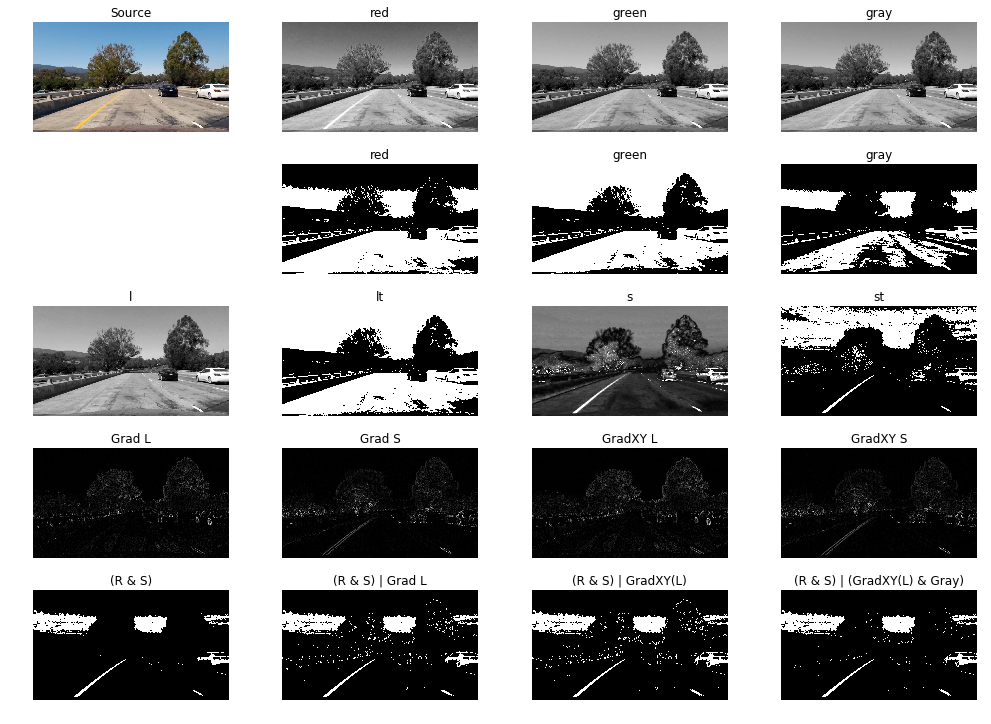

In [12]:
find_best_channel('./test_images/test1.jpg')

./test_images/test2.jpg


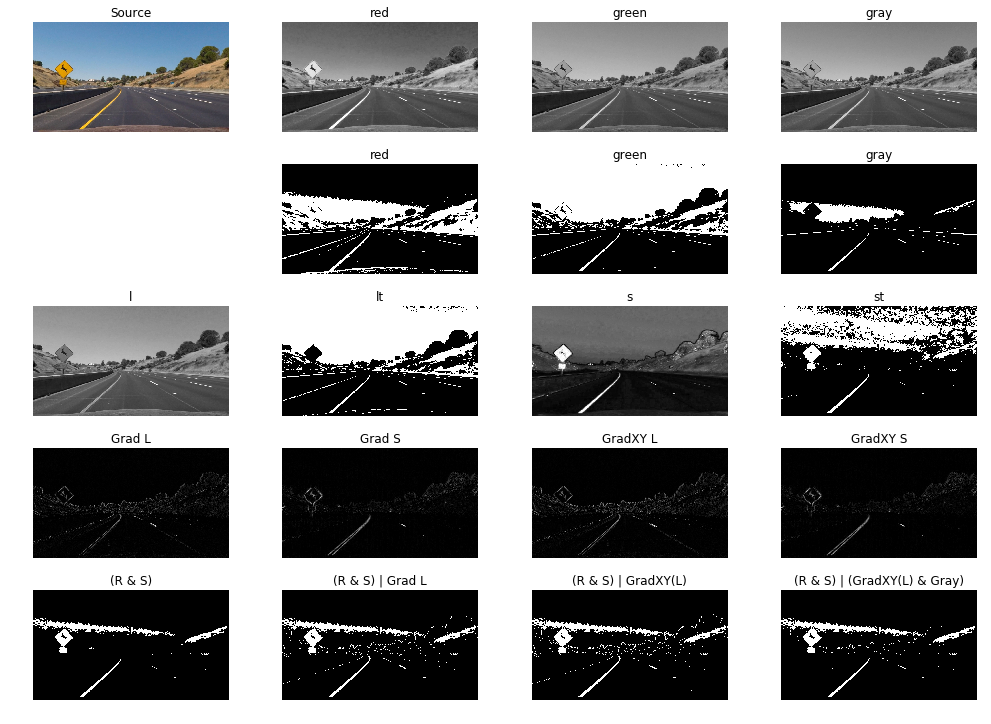

In [13]:
find_best_channel('./test_images/test2.jpg')


./test_images/test3.jpg


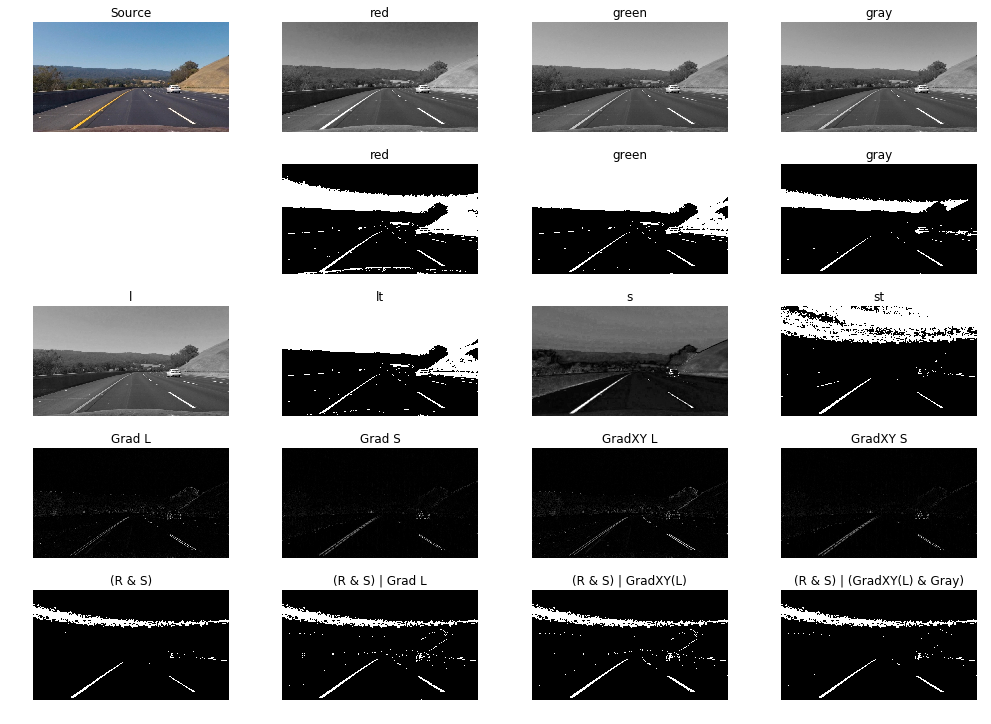

In [14]:
find_best_channel('./test_images/test3.jpg')

./test_images/test4.jpg


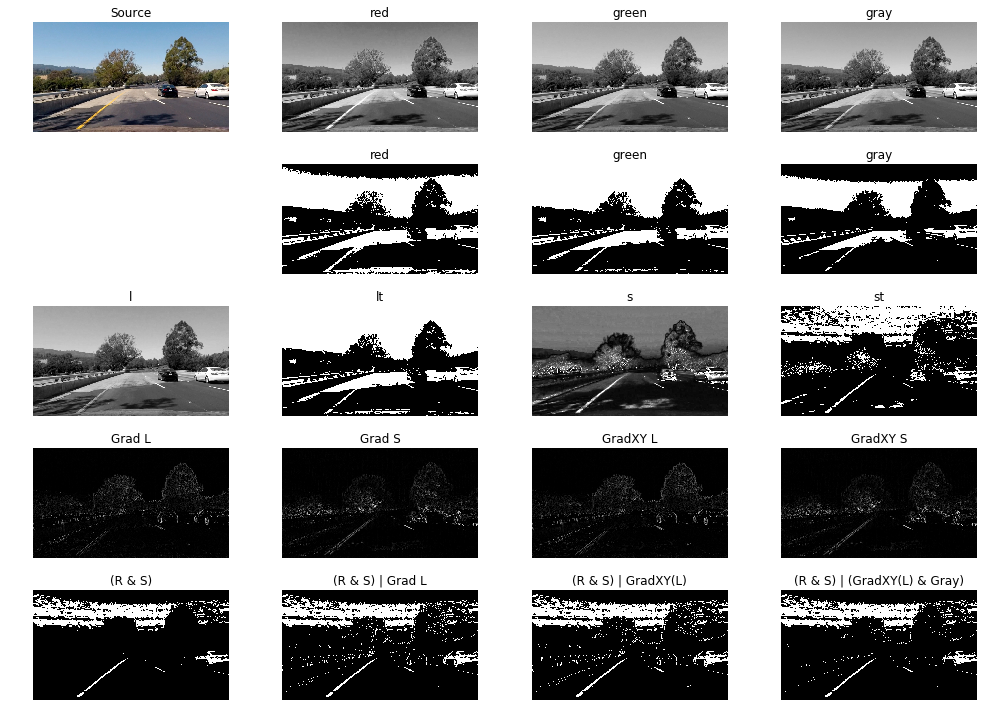

In [15]:
find_best_channel('./test_images/test4.jpg')

./test_images/test5.jpg


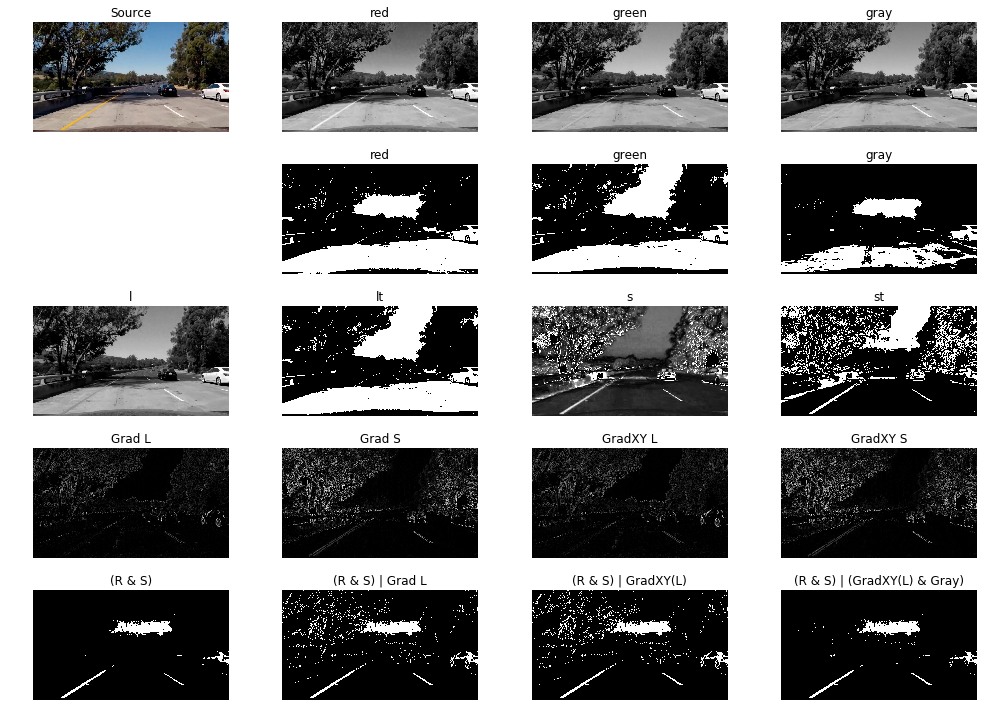

In [16]:
find_best_channel('./test_images/test5.jpg')


./test_images/test6.jpg


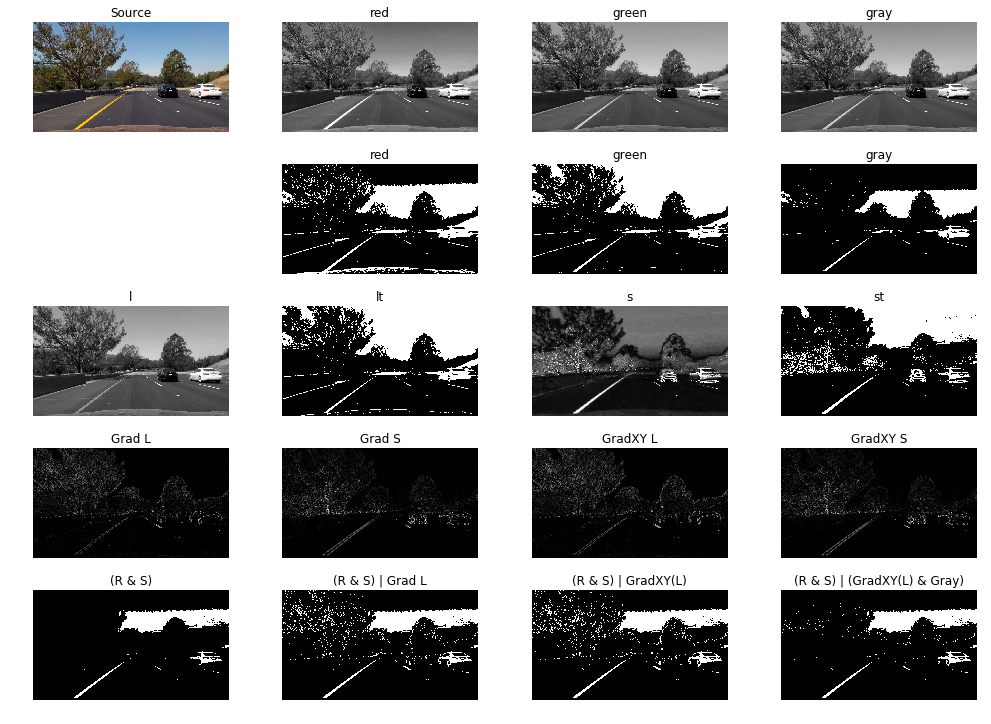

In [17]:
find_best_channel('./test_images/test6.jpg')

./test_images/42.jpg


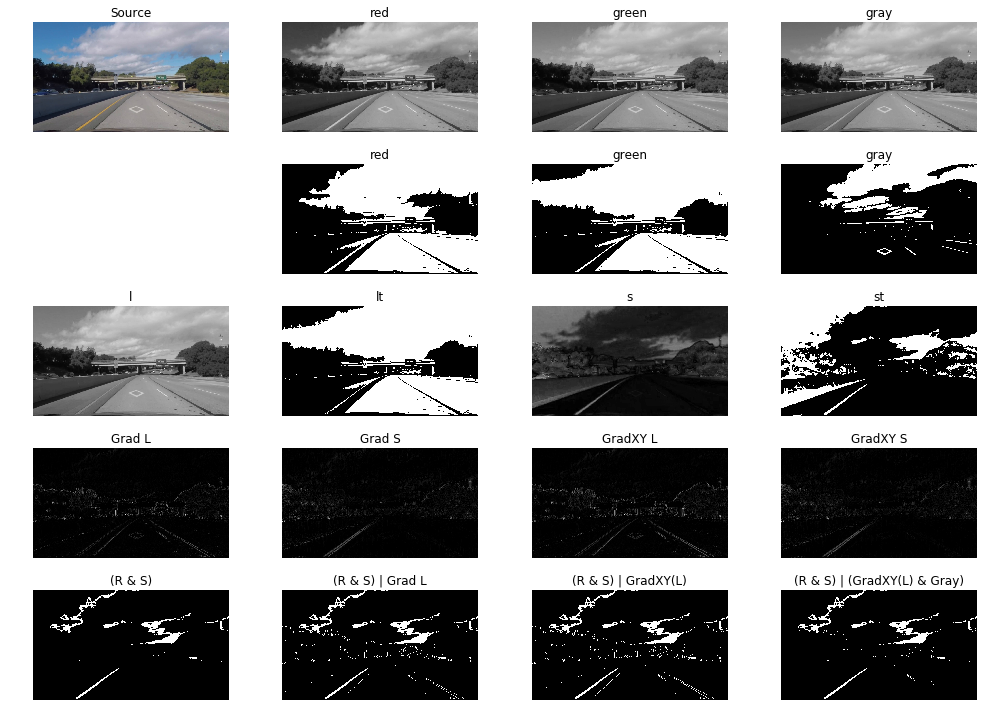

In [18]:
find_best_channel('./test_images/42.jpg')

./test_images/617.jpg


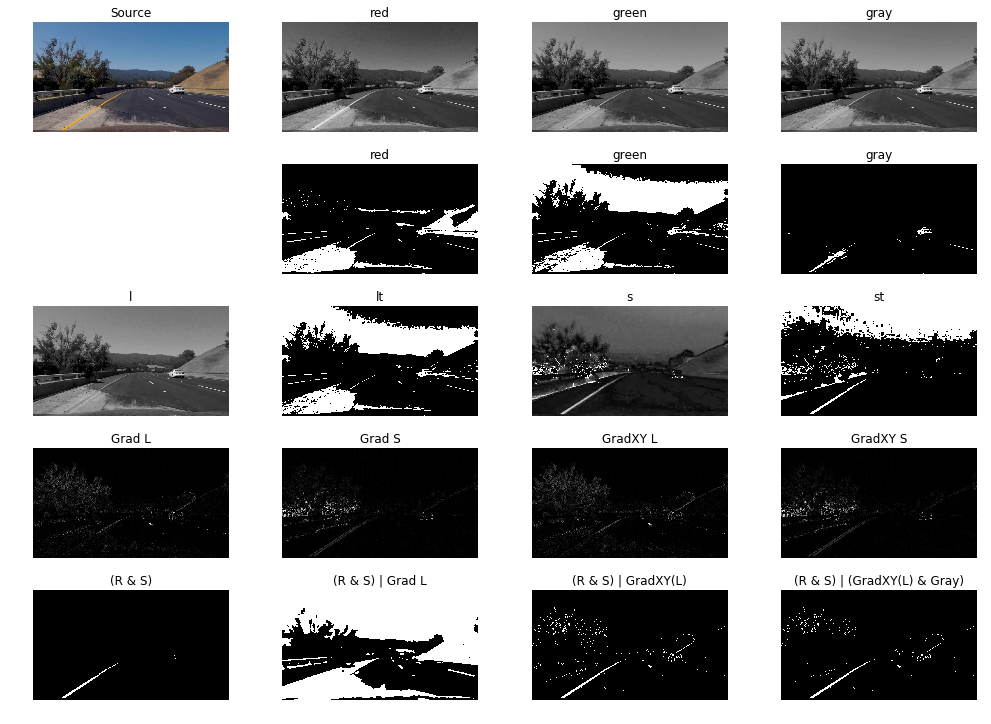

In [32]:
find_best_channel('./test_images/617.jpg')

./test_images/32.jpg


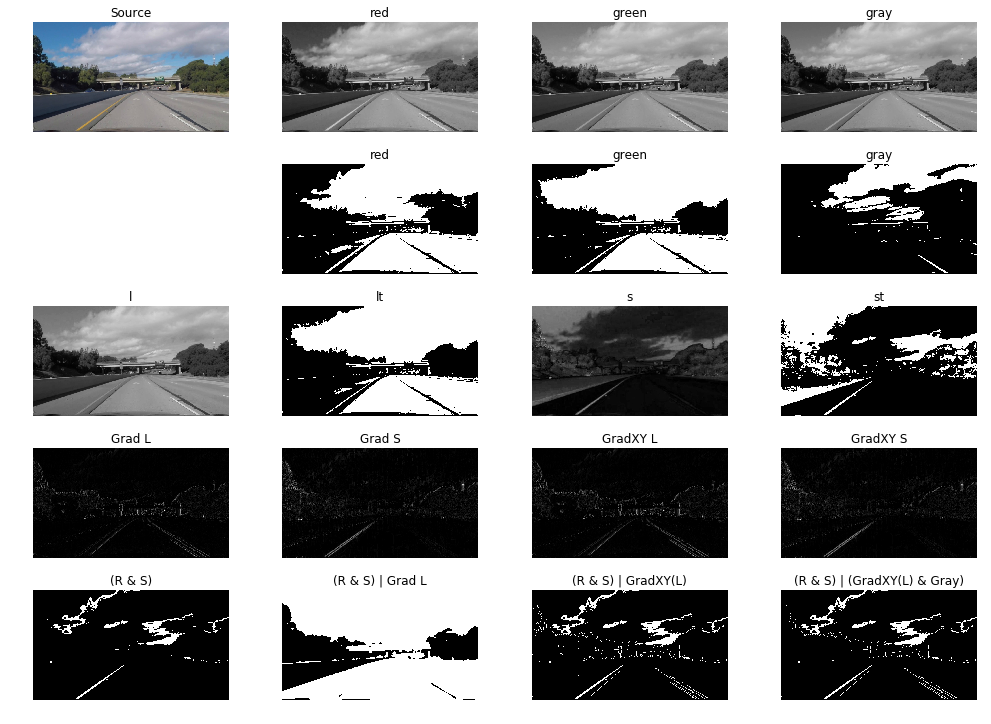

In [33]:
find_best_channel('./test_images/32.jpg')

### 3.3 Combine thresholded images

After inspecting the images above I decided to use the following combination of methods:

1. Apply threshold to R channel in RGB color space
2. Histogram correction of S channel in HLS color space
3. Apply threshold to step 2 output
4. Bitwise AND combination of steps 1 (R) and 3 (S)
5. Calculate XY gradient of L channel in HLS color space
6. Cut from it points having almost vertical gradient (horizontal lines)
7. Apply threshold to step 6 output
8. Bitwise OR combination of steps 4 and 6

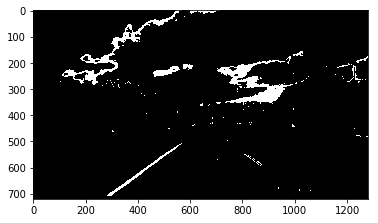

In [35]:
def process_image(image):
    
    # Distortion correction
    undistorted = undistort(image)
    
    # Split channels
    red = undistorted[:,:,2]
    gray = cv2.cvtColor(undistorted, cv2.COLOR_BGR2GRAY)
    gray_blur = thresholded_binary(cv2.GaussianBlur(gray, (15, 15), 0), (128,255))
    
    # HLS
    hls = cv2.cvtColor(undistorted, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Step 1
    red_thresholded = thresholded_binary(red, threshold=(128,255))
    
    # Step 2
    s_channel = cv2.equalizeHist(s_channel)
    
    # Step 3
    s_thresholded = thresholded_binary(s_channel, threshold=(192,255))
    
    # Step 4
    red_and_s = combine_and(red_thresholded, s_thresholded)
    
    # Steps 5,6
    l_gradient = gradient_xy(l_channel, sobel_kernel = 9, dir_threshold = (0, 1.1))
    
    # Step 7
    l_gradient_thresholded = thresholded_binary(l_gradient, threshold = (60,255))
    
    # Step 8    
    result = combine_or(red_and_s, l_gradient_thresholded)
    
    # Step 9
    result = combine_and(result, gray_blur)
    
    return result

img = cv2.imread('./test_images/42.jpg')
processed = process_image(np.copy(img))
plt.imshow(processed, cmap='gray')
plt.show()

### 3.4 Test binary images

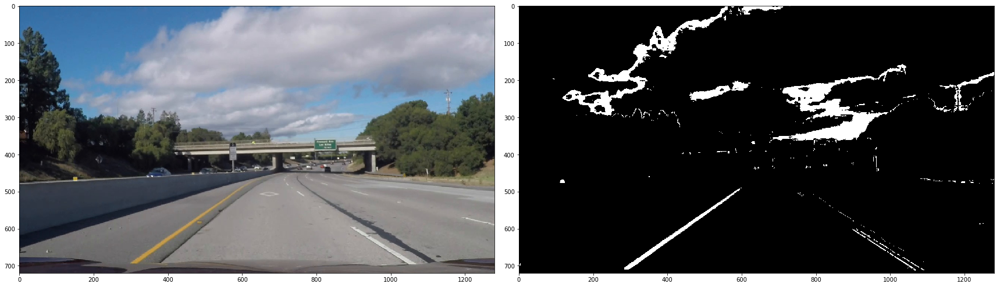

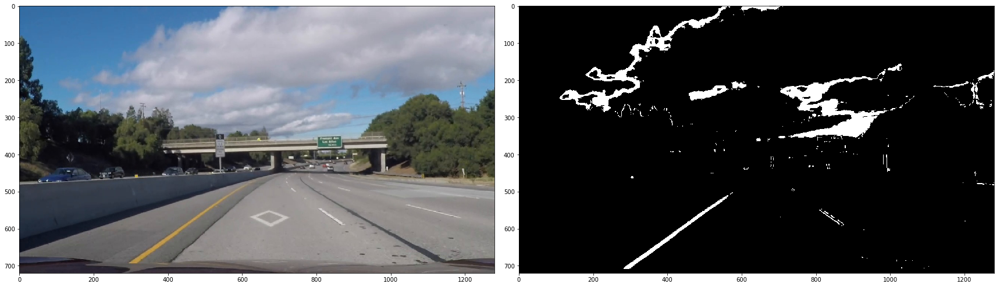

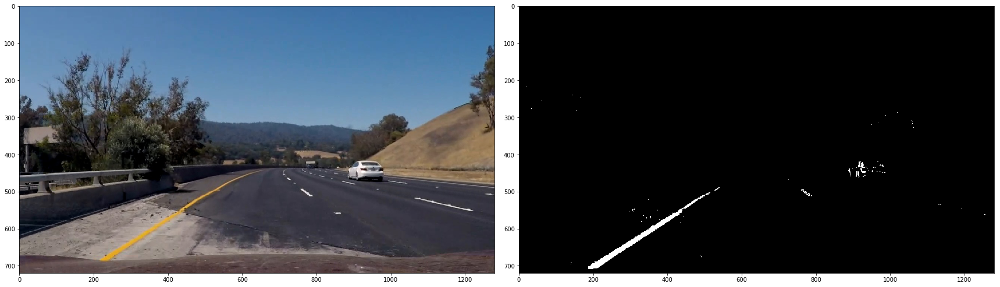

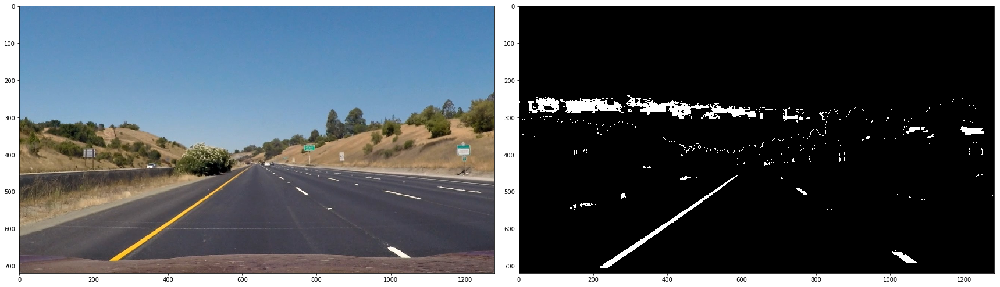

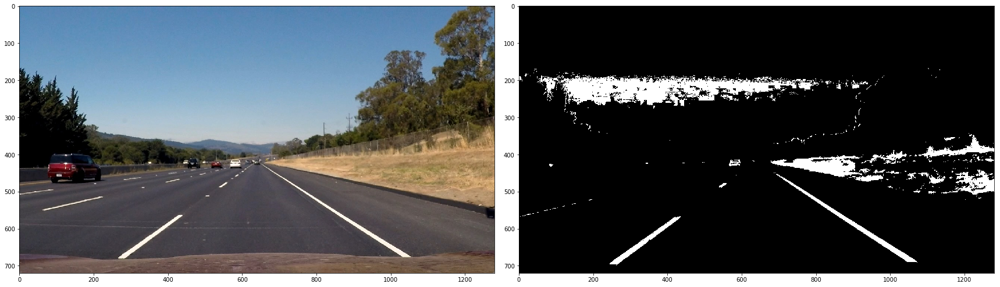

...

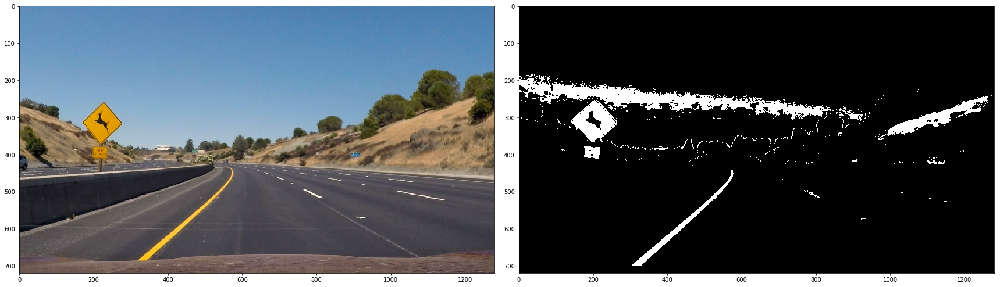

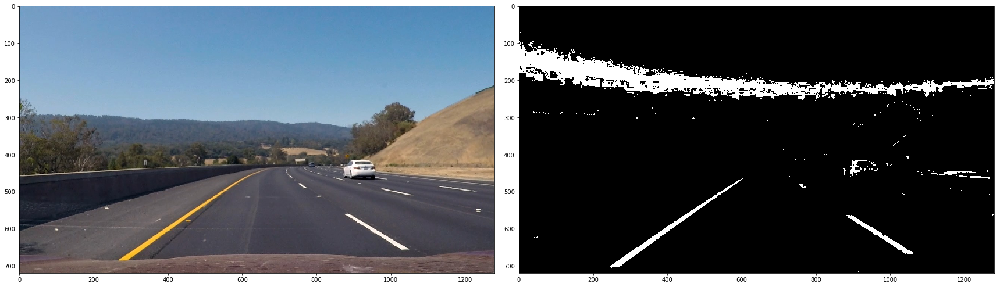

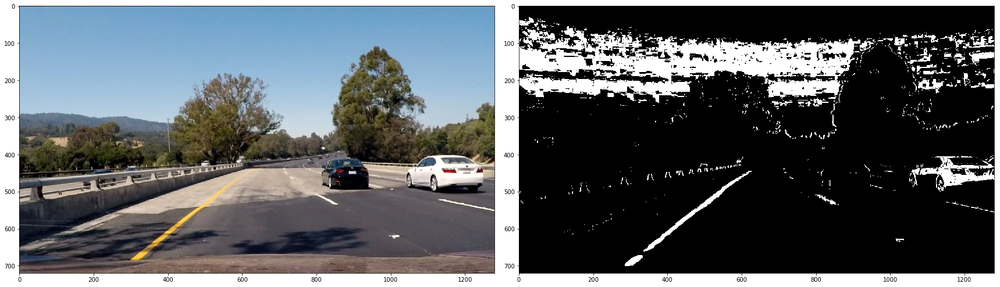

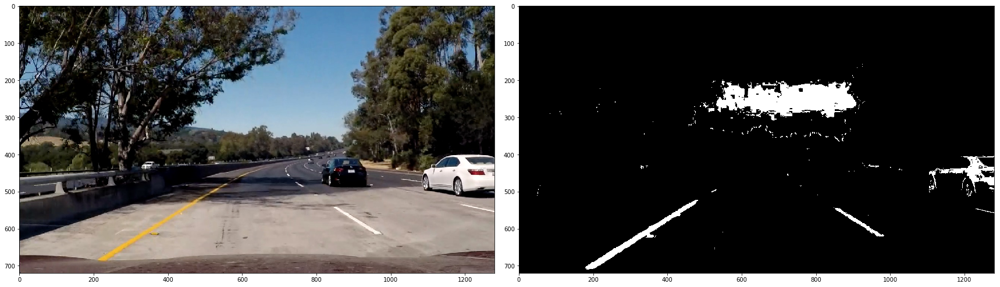

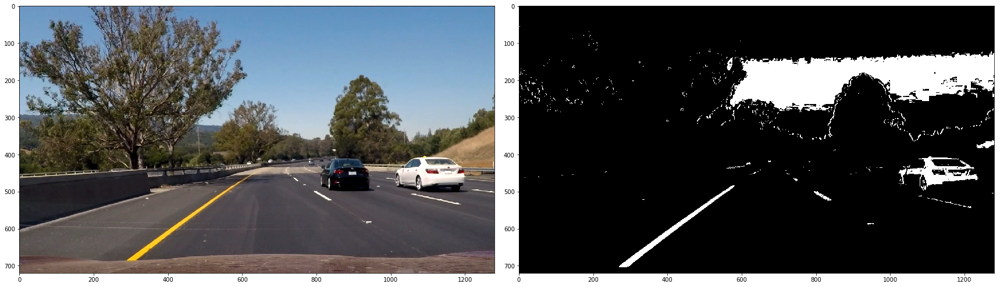

In [36]:
%matplotlib inline

images = glob.glob('./test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    processed = process_image(np.copy(img))
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(24, 9))
    f.tight_layout()
    
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax2 = plt.imshow(processed, cmap='gray')
    plt.show()


## 4 Apply a perspective transform to rectify binary image ("birds-eye view")

First I took one image where the car drives in the middle of uncurved line and manually defined transformation area

![keypoints](img/perspective.jpg)



### 4.1 Calculate perspective transformation matrix

In [37]:
# Hardcode keypoints from the image above
src = np.float32([[207,719],[597,450],[686,450],[1107,719]])
dst = np.float32([[300,719],[300,0],[1279-300,0],[1279-300,719]])

# Transformation matrix
M = cv2.getPerspectiveTransform(src, dst)

# Inverse transformation (we will need it in step 7)
Minv = cv2.getPerspectiveTransform(dst, src)

def warped(image):
    size = image.shape[1::-1]
    result = cv2.warpPerspective(image, M, size)
    return result

def warped_binary(image):
    size = image.shape[1::-1]
    binary = process_image(image)
    
    result = cv2.convertScaleAbs(cv2.warpPerspective(binary, M, size))
    return result

### 4.2 Test on reference image

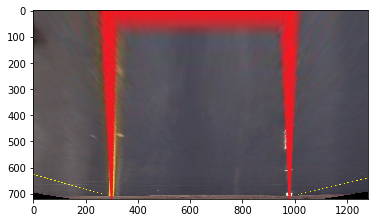

In [38]:
img = cv2.imread('./img/perspective.jpg')
result = warped(np.copy(img))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    

./test_images\32.jpg


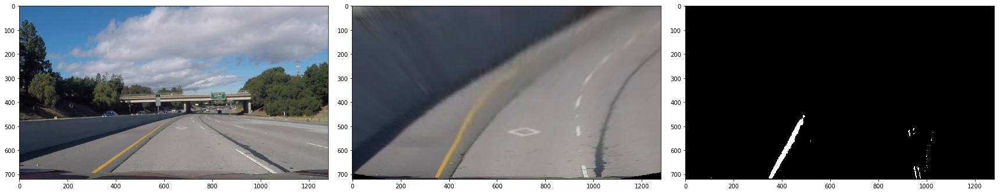

./test_images\42.jpg


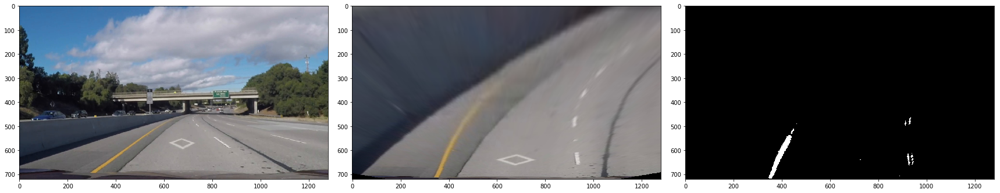

./test_images\617.jpg


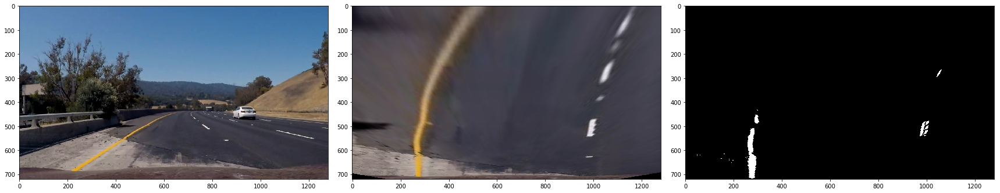

./test_images\straight_lines1.jpg


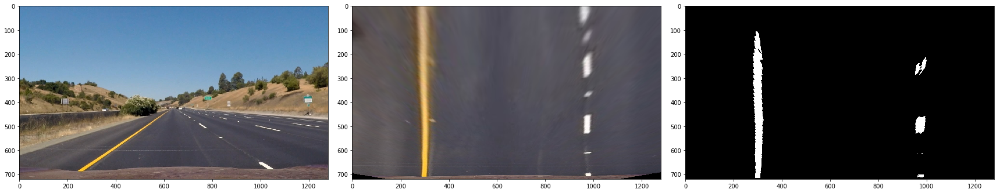

./test_images\straight_lines2.jpg


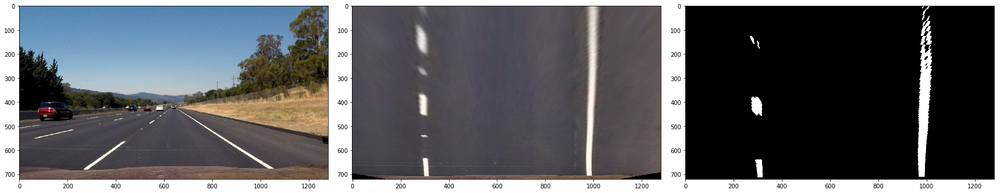

./test_images\test1.jpg


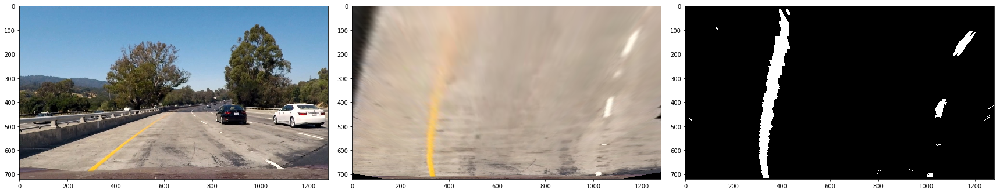

./test_images\test2.jpg


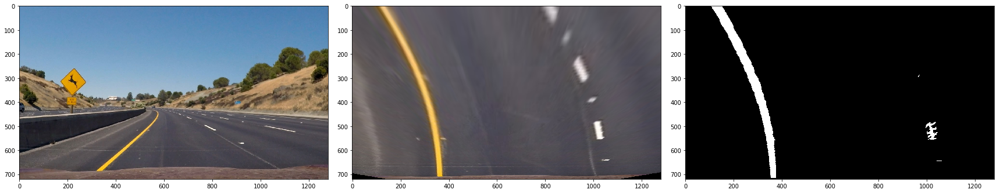

./test_images\test3.jpg


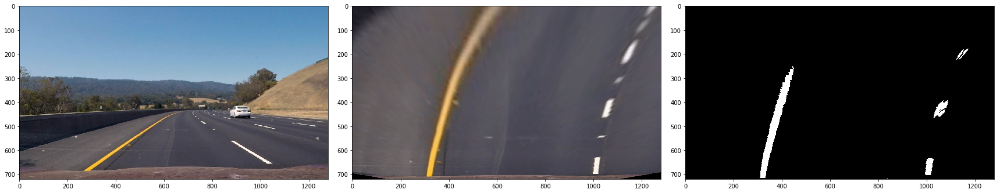

./test_images\test4.jpg


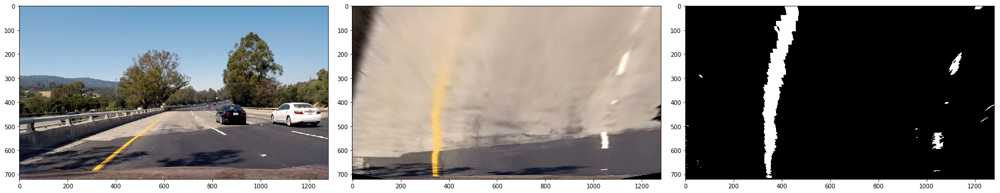

./test_images\test5.jpg


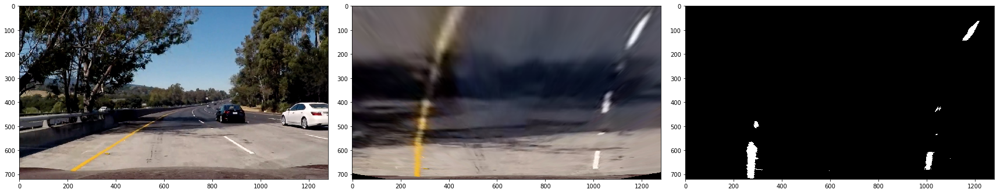

./test_images\test6.jpg


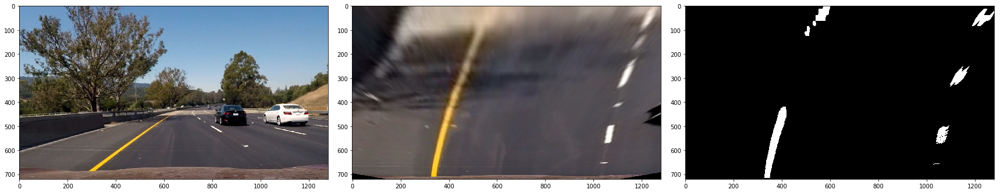

In [39]:
images = glob.glob('./test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    warped_img = warped(img)
    warped_bimg = warped_binary(img)
    
    print(fname)
    f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(24, 9))
    f.tight_layout()
    
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax2.imshow(cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB))
    ax3.imshow(warped_bimg, cmap = 'gray')
    plt.show()

## 5. Detect lane pixels and fit to find the lane boundary.

Here I am using finding peaks in a histogram to detect lane boundary as proposed in Udacity lection 33.

In [40]:
def find_lines_with_histogram(image, preview = False):
    
    binary_warped = warped_binary(image)
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    #plt.plot(histogram)
    #plt.show()
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    val_l = histogram[leftx_base]
    val_r = histogram[rightx_base]
    
    quality_left = min(val_l / 50, 1.0)
    quality_right = min(val_r / 50, 1.0)
    
    #print(val_l, val_r)

    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    
    if preview == True:
    
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0], dtype=np.int )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')

        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
    
    
    return (left_fit, right_fit, quality_left, quality_right)
    


### 5.1 Visualize it 

C:\Users\Victor\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


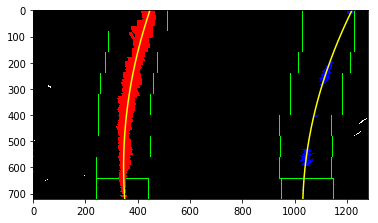

Left line polynomial  [  2.81472583e-04  -3.36205668e-01   4.46428172e+02]
Right line polynomial  [  3.18551052e-04  -4.89446986e-01   1.21879708e+03]


In [41]:
img = cv2.imread('./test_images/test4.jpg')
lp, rp, _,_ = find_lines_with_histogram(np.copy(img), True)

print("Left line polynomial ",  lp)
print("Right line polynomial ",rp)

### 5.2 Incremental line search when we already know estimated leine position

In [42]:
def find_lines_incremental(image, base_poly_left, base_poly_right):
   
    binary_warped = warped_binary(image)
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    
    left_lane_points = base_poly_left[0]*(nonzeroy**2) + base_poly_left[1]*nonzeroy + base_poly_left[2]
    left_lane_inds = np.absolute(nonzerox - left_lane_points) < margin
    
    right_lane_points = base_poly_right[0]*(nonzeroy**2) + base_poly_right[1]*nonzeroy + base_poly_right[2]
    right_lane_inds = np.absolute(nonzerox - right_lane_points) < margin

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # If our polynomial were calculated from 1000 or more points, consider the quality be 100%
    quality_left = min(1, len(lefty)/1000)
    quality_right = min(1, len(righty)/1000)
    
    
    return left_fit, right_fit, quality_left, quality_right
    


### 5.3 Visualize it

Incremental search left line polynomial  [  2.81472583e-04  -3.36205668e-01   4.46428172e+02]
Incremental search right line polynomial  [  3.24858137e-04  -4.94610220e-01   1.21969461e+03]
Quality left, right:  1 1


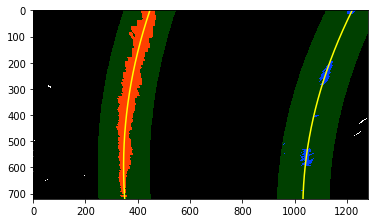

In [43]:
left_fit, right_fit, ql,qr = find_lines_incremental(np.copy(img), lp, rp)    

print("Incremental search left line polynomial ",  left_fit)
print("Incremental search right line polynomial ",right_fit)
print("Quality left, right: ",ql, qr)

binary_warped = warped_binary(img)

ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

for y in range(binary_warped.shape[0]):
    for x in range(binary_warped.shape[1]):
        if np.abs(x - left_fitx[y]) < 100:
            if binary_warped[y, x] > 0:
                out_img[y,x] = [255,64,0]    
            else:
                out_img[y,x] = [0,64,0]    
        if np.abs(x - right_fitx[y]) < 100:
            if binary_warped[y, x] > 0:
                out_img[y,x] = [0,64,255]    
            else:
                out_img[y,x] = [0,64,0]    

#out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
#out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')

plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()




## 6. Determine the curvature of the lane and vehicle position with respect to center

Knowing polynomial coefficients A,B,C we can represent line as function f(y):

$$f(y) = Ay^2 + By + C$$

Radius of curvature is calculated as following

$$R = \frac{(1-(2Ay-B)^2)^\frac{3}{2}}{|2A|}$$

In [44]:
class FrameInfo():
    def __init__(self, frame_height, frame_width, left_poly, right_poly, quality_left, quality_right):
        self.frame_height = frame_height
        self.frame_width = frame_width
        self.left_poly = left_poly
        self.right_poly = right_poly
        self.quality_left = quality_left
        self.quality_right = quality_right
        self.radius = 0
        self.position = 0
        
    def curvature(self):
        y_eval = self.frame_height
        left_fit = self.left_poly
        right_fit = self.right_poly
        
        count = 0
        
        if self.quality_left > 0.5:
            left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
            count += 1
        else:
            left_curverad = 0
            
        if self.quality_right > 0.5:
            right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
            count += 1
        else:
            right_curverad = 0
            
        self.radius = (left_curverad + right_curverad) / count
        return self.radius
        
    def pos(self):
        # Here we assume the lane be 3.7 meter wide
        px = self.frame_height - 1
        
        lx = px*px*self.left_poly[0] + px*self.left_poly[1] + self.left_poly[2]
        rx = px*px*self.right_poly[0] + px*self.right_poly[1] + self.right_poly[2]
        scale = (rx - lx) / 3.7
        lane_center = (lx + rx) / 2.0
        # print(lx, rx, lane_center)
        
        self.position = (self.frame_width / 2 - lane_center) / scale
        return self.position
        
def analyze_frame(image, preview = False):
    lp, rp, ql, qr = find_lines_with_histogram(image, preview)
    frame_info = FrameInfo(img.shape[0], image.shape[1], lp, rp, ql, qr)
    return frame_info

def analyze_frame_inc(image, base_frame_info):
    lp, rp, ql, qr = find_lines_incremental(image, base_frame_info.left_poly, base_frame_info.right_poly)
    frame_info = FrameInfo(img.shape[0], image.shape[1], lp, rp, ql, qr)
    return frame_info

    
def analyze_file(file_name):
    image = cv2.imread(file_name)
    frame_info = analyze_frame(image)
    c = frame_info.curvature()
    p = frame_info.pos()
    print("Curvature: ", c, "Position: ", p)
    
    
analyze_file('./test_images/test3.jpg')    
    


Curvature:  2053.13671391 Position:  -0.113223387323


C:\Users\Victor\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


## 7. Warp the detected lane boundaries back onto the original image.

C:\Users\Victor\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


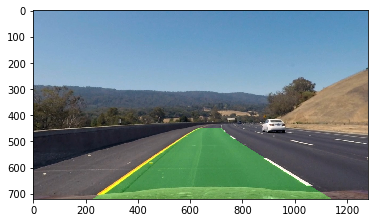

In [45]:
def draw_measurement(image, frame_info):
    color_warp = np.zeros_like(image).astype(np.uint8)
    height = image.shape[0]
    
    # Prepare values
    ploty = np.linspace(0, height-1, height, dtype=np.int)
    left_fitx = frame_info.left_poly[0]*ploty**2 + frame_info.left_poly[1]*ploty + frame_info.left_poly[2]
    right_fitx = frame_info.right_poly[0]*ploty**2 + frame_info.right_poly[1]*ploty + frame_info.right_poly[2]
    
    # Calculate points
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    undist = undistort(image)
    
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    return result
    
image = cv2.imread('./test_images/test3.jpg')
frame_info = analyze_frame(image, False)
img = draw_measurement(image, frame_info)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()


## 8. Show numerical estimation of lane curvature and vehicle position

C:\Users\Victor\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


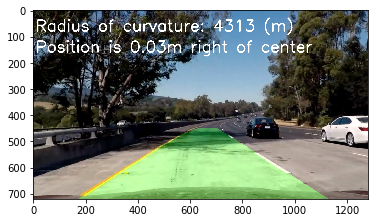

In [46]:
def map_lane(image, frame_info):
    result = np.copy(draw_measurement(image, frame_info))
    
    ctext = "Radius of curvature: {:.0f} (m)".format(frame_info.curvature())
    
    if frame_info.pos() < 0:
        ptext = "Position is {:.2f}m left of center".format(-frame_info.pos())
    else:
        ptext = "Position is {:.2f}m right of center".format(frame_info.pos())
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,ctext,(10,80), font, 2,(255,255,255),4,cv2.LINE_AA)
    cv2.putText(result,ptext,(10,160), font, 2,(255,255,255),4,cv2.LINE_AA)
    return result
    
    
image = cv2.imread('./test_images/test5.jpg')
frame_info = analyze_frame(image, False)
img = map_lane(image, frame_info)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()


### Process sample video

In [47]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

sampe_video = 'project_video.mp4'
video_output = 'project_video_output.mp4'

idx = 0
current_image = None
drop = 0
outliers = 0
frame_info = None
smooth_frame_info = None
quality = 1

alpha = 0.1

def process_video_frame(image):
    global idx
    global current_image
    global drop
    global frame_info
    global smooth_frame_info
    global quality
    global outliers

    current_image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    try :
        if (smooth_frame_info is not None) and (quality > 0.9):
            # Use incremental search
            frame_info = analyze_frame_inc(current_image, smooth_frame_info)
        else:
            # Run full frame analyzis
            frame_info = analyze_frame(current_image, False)
    except TypeError:
        drop += 1
        cv2.imwrite('./problems/{0}.jpg'.format(idx), current_image)
        
    lx = frame_info.left_poly[2]
    rx = frame_info.right_poly[2]
    middle = image.shape[1] / 2
    
    quality = (frame_info.quality_left + frame_info.quality_right) / 2
    
    weight = 1
    
    # Detect outlier 
    if abs(lx - middle) > 1000 or abs(rx - middle) > 1000:
        cv2.imwrite('./outliers/{0}.jpg'.format(idx), current_image)
        weight = 0
        outliers += 1
        
    if smooth_frame_info == None:
        smooth_frame_info = frame_info
        
    # Add some inertia with low pass filter
    smooth_frame_info.left_poly = smooth_frame_info.left_poly * (1-alpha*weight) + frame_info.left_poly * alpha * weight
    smooth_frame_info.right_poly = smooth_frame_info.right_poly * (1-alpha* weight) + frame_info.right_poly * alpha * weight
    
    lane = map_lane(current_image, smooth_frame_info)
    idx += 1
    
    result = cv2.cvtColor(lane, cv2.COLOR_BGR2RGB)
    return result
    
    
clip1 = VideoFileClip(sampe_video)
white_clip = clip1.fl_image(process_video_frame) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

print("Drop count: ", drop)
print("Outliers count: ", outliers)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:23<00:00,  4.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 4min 23s
Drop count:  0
Outliers count:  0


In [48]:
challenge_video = 'challenge_video.mp4'
challenge_video_output = 'challenge_video_output.mp4'

idx = 0
current_image = None
drop = 0
outliers = 0
frame_info = None
smooth_frame_info = None
quality = 1

clip1 = VideoFileClip(challenge_video)
white_clip = clip1.fl_image(process_video_frame) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_video_output, audio=False)

print("Drop count: ", drop)
print("Outliers count: ", outliers)


[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:44<00:00,  4.54it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

Wall time: 1min 45s
Drop count:  7
Outliers count:  53
